In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np
from sklearn.decomposition import IncrementalPCA
from random import sample
from numpy.random import uniform
from sklearn.neighbors import NearestNeighbors
from math import isnan
from sklearn.preprocessing import scale
import geopandas as gpd
import contextily as ctx 


In [2]:
local_crs = 27700
place = "test"
lat = 55.86421405612109
lng = -4.251846930489373
country = "UK"
crs=4326
radius=1

In [3]:
grid = gpd.read_parquet(f"../output/{place}/p5-grid-output.pq")

In [4]:
grid.set_index(['row', 'col'], inplace=True)

In [5]:
geo_col = grid[['geometry']]

In [6]:
geo_col

geometry
row col                                                   
5   20   POLYGON ((259858.895 666247.963, 259948.537 66...
12  19   POLYGON ((259774.390 665468.093, 259864.038 66...
14  20   POLYGON ((259865.508 665241.547, 259955.158 66...
    19   POLYGON ((259775.858 665244.452, 259865.508 66...
    14   POLYGON ((259327.610 665259.004, 259417.260 66...
...                                                    ...
2   15   POLYGON ((259408.494 666598.003, 259498.133 66...
    16   POLYGON ((259498.133 666595.089, 259587.773 66...
    10   POLYGON ((258960.297 666612.599, 259049.936 66...
3   9    POLYGON ((258871.383 666503.692, 258961.023 66...
2   9    POLYGON ((258870.658 666615.524, 258960.297 66...

[272 rows x 1 columns]

In [7]:
colsubset = grid.head().columns.tolist()

In [8]:
grid.describe()

,tess_area_median,tess_area_q25,tess_area_q75,tessellation_neighbours_median,tessellation_neighbours_q25,tessellation_neighbours_q75,tess_convexity_median,tess_convexity_q25,tess_convexity_q75,tess_covered_area_median,...,edges_global_angular_closeness_quantile_0.75,edges_global_angular_betweeness_median,edges_global_angular_betweeness_quantile_0.25,edges_global_angular_betweeness_quantile_0.5,edges_global_angular_betweeness_quantile_0.75,strokes_count,strokes_stroke_length_median,strokes_stroke_length_quantile_0.25,strokes_stroke_length_quantile_0.5,strokes_stroke_length_quantile_0.75
count,272.000000,272.000000,272.000000,272.000000,272.000000,272.000000,272.000000,272.000000,272.000000,272.000000,...,272.000000,272.000000,272.000000,272.000000,272.000000,272.0,272.000000,272.000000,272.000000,272.000000
mean,6469.103657,4075.281837,12075.634578,0.152448,0.124955,0.190333,0.940984,0.879331,0.971672,63007.094130,...,0.030599,0.000503,0.000087,0.000503,0.002970,161.0,408.201847,167.918924,408.201847,1081.151486
std,3631.184047,2614.142753,8814.849921,0.041521,0.037394,0.058465,0.032373,0.061406,0.025553,42121.295943,...,0.002340,0.000262,0.000084,0.000262,0.002975,0.0,264.537484,142.508150,264.537484,565.751366
min,1885.136224,714.067286,2923.672383,0.042939,0.042939,0.042939,0.757228,0.625969,0.757228,19407.210268,...,0.023293,0.000060,0.000000,0.000060,0.000434,161.0,83.670349,36.643006,83.670349,149.502628
25%,3921.980403,2244.699128,6421.419306,0.121397,0.093925,0.151566,0.926439,0.862878,0.961286,33925.697489,...,0.028533,0.000370,0.000008,0.000370,0.001527,161.0,212.941878,84.126754,212.941878,683.754716
50%,5678.075163,3617.199699,8991.244081,0.159466,0.126797,0.187331,0.946276,0.890243,0.977396,44911.201357,...,0.031188,0.000493,0.000071,0.000493,0.002382,161.0,343.445925,139.587107,343.445925,1003.104180
75%,7503.379244,4882.203574,14661.124676,0.178083,0.152236,0.227276,0.960381,0.922332,0.983943,75204.376947,...,0.032073,0.000590,0.000131,0.000590,0.003537,161.0,503.984540,188.163212,503.984540,1264.984611
max,27419.366823,18303.334011,48487.119144,0.250989,0.226607,0.389437,0.993420,0.986502,0.999215,223772.705955,...,0.038649,0.001349,0.000386,0.001349,0.028999,161.0,1458.291459,856.735127,1458.291459,3644.438338


In [9]:
grid_dropped = grid.fillna(0)

In [10]:
grid_dropped[grid_dropped['geometry'].isnull()]

,,tess_area_median,tess_area_q25,tess_area_q75,tessellation_neighbours_median,tessellation_neighbours_q25,tessellation_neighbours_q75,tess_convexity_median,tess_convexity_q25,tess_convexity_q75,tess_covered_area_median,...,edges_global_angular_betweeness_median,edges_global_angular_betweeness_quantile_0.25,edges_global_angular_betweeness_quantile_0.5,edges_global_angular_betweeness_quantile_0.75,strokes_count,strokes_stroke_length_median,strokes_stroke_length_quantile_0.25,strokes_stroke_length_quantile_0.5,strokes_stroke_length_quantile_0.75,geometry
row,col,,,,,,,,,,,,,,,,,,,,,


In [11]:
# grid_dropped.explore()

In [12]:
grid_dropped.columns.tolist()

['tess_area_median',
 'tess_area_q25',
 'tess_area_q75',
 'tessellation_neighbours_median',
 'tessellation_neighbours_q25',
 'tessellation_neighbours_q75',
 'tess_convexity_median',
 'tess_convexity_q25',
 'tess_convexity_q75',
 'tess_covered_area_median',
 'tess_covered_area_q25',
 'tess_covered_area_q75',
 'tess_orientation_median',
 'tess_orientation_q25',
 'tess_orientation_q75',
 'tess_convexity_weight_median',
 'tess_convexity_weight_q25',
 'tess_convexity_weight_q75',
 'tess_covered_area_weight_median',
 'tess_covered_area_weight_q25',
 'tess_covered_area_weight_q75',
 'tess_orientation_weight_median',
 'tess_orientation_weight_q25',
 'tess_orientation_weight_q75',
 'tess_rea_theil_median',
 'tess_rea_theil_q25',
 'tess_rea_theil_q75',
 'buildings_neighbours_200_median',
 'buildings_neighbours_200_q25',
 'buildings_neighbours_200_q75',
 'building_area_median',
 'building_area_q25',
 'building_area_q75',
 'building_circular_compactness_median',
 'building_circular_compactness_q25

In [13]:
grid_dropped = grid.dropna(subset=["entry_count"], how='all')
grid_dropped = grid_dropped[grid_dropped['entry_count'] > 2]

In [14]:
grid_dropped

tess_area_median  tess_area_q25  tess_area_q75  \
row col                                                   
5   20        6608.405596    4658.399430    8222.970961   
12  19        3345.593685    2183.957779    9158.998481   
14  20        5678.075163    2694.049688    6946.596752   
    19        5258.714810    2564.801374    6910.360351   
    14        6308.048325    2248.192287    8791.497251   
...                   ...            ...            ...   
3   6         8929.101532    3773.864095   10845.168659   
2   15        2046.177921     714.067286   11248.761470   
    10        8123.856648    6167.087854    8123.856648   
3   9         8892.111843    4741.603410   14396.317325   
2   9        14396.317325   14396.317325   15530.125852   

         tessellation_neighbours_median  tessellation_neighbours_q25  \
row col                                                                
5   20                         0.098272                     0.067767   
12  19                         0.160270                     0.143848   
14  20                         0.139944                     0.134007   
    19                         0.155792                     0.134943   
    14                         0.157815                     0.126668   
...                                 ...                          ...   
3   6                          0.074137                     0.053475   
2   15                         0.113739                     0.065910   
    10                         0.101819                     0.101819   
3   9                          0.082362                     0.070290   
2   9                          0.070290                     0.055915   

         tessellation_neighbours_q75  tess_convexity_median  \
row col                                                       
5   20                      0.101149               0.923577   
12  19                      0.213942               0.910727   
14  20                      0.160270               0.947574   
    19                      0.180249               0.944716   
    14                      0.208843               0.989516   
...                              ...                    ...   
3   6                       0.122604               0.864655   
2   15                      0.187968               0.932363   
    10                      0.109553               0.909641   
3   9                       0.096287               0.958801   
2   9                       0.070290               0.757228   

         tess_convexity_q25  tess_convexity_q75  tess_covered_area_median  \
row col                                                                     
5   20             0.900209            0.966882              44911.201357   
12  19             0.891613            0.972147              32172.946082   
14  20             0.889982            0.973836              34172.401614   
    19             0.861820            0.972709              34675.058111   
    14             0.877318            0.996302              52018.903413   
...                     ...                 ...                       ...   
3   6              0.752186            0.965862              34977.297513   
2   15             0.869238            0.982201              25050.931040   
    10             0.909641            0.929929              49575.871131   
3   9              0.757228            0.984437              58112.730593   
2   9              0.625969            0.757228              62928.267797   

         ...  edges_global_angular_betweeness_median  \
row col  ...                                           
5   20   ...                                0.000327   
12  19   ...                                0.000516   
14  20   ...                                0.000765   
    19   ...                                0.000747   
    14   ...                                0.000262   
...      ...                                     ...   
3   6    ...                      

In [15]:
grid_dropped.isnull().sum(axis=1).value_counts(ascending=False)

0    271
Name: count, dtype: int64

In [16]:
grid_dropped_geo = grid_dropped
grid_dropped = grid_dropped.drop(columns=["geometry"])

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/seaborn/utils.py:80: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.draw()
/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
/tmp/ipykernel_5633/2699268375.py:3: UserWarning: Glyph 9 (	) missing from current font.
  plt.savefig('Correlation')
/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


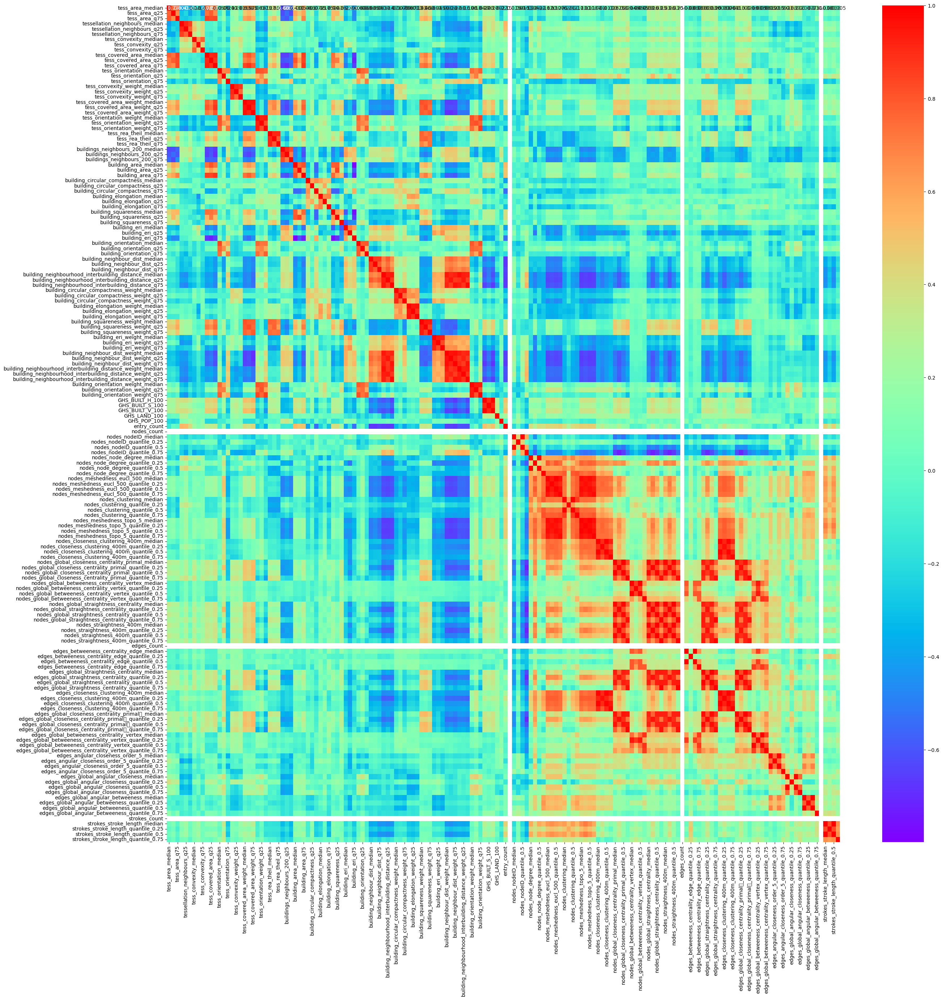

In [17]:
plt.figure(figsize = (30, 30))
sns.heatmap(grid_dropped.corr(), annot = True, cmap="rainbow")
plt.savefig(f'../output/{place}Correlation.png')
plt.show()

In [18]:
str(grid_dropped.index[0])

'(5, 20)'

In [19]:
scaler = StandardScaler()
tessellation_scaled = scaler.fit_transform(grid_dropped)

In [20]:
pca = PCA(svd_solver='randomized', random_state=50)


In [21]:
pca.fit(tessellation_scaled)

PCA(random_state=50, svd_solver='randomized')

In [22]:
features = grid_dropped.columns

In [23]:
pca.components_

array([[-4.77597839e-02, -4.75738525e-02, -4.67226251e-02, ...,
        -5.84417527e-02, -7.69304165e-02, -4.11773929e-02],
       [-1.12723298e-01, -1.03749973e-01, -1.42971876e-01, ...,
         6.20509010e-02,  7.97018141e-02,  3.68404094e-02],
       [-4.34043317e-02, -5.24711603e-02, -7.07647904e-02, ...,
        -1.80069005e-02, -4.80141008e-02,  1.64900282e-02],
       ...,
       [-0.00000000e+00,  4.50685089e-17, -1.45552638e-16, ...,
         4.27924420e-17, -7.46241795e-02, -1.14782801e-17],
       [-0.00000000e+00, -1.70005748e-17, -1.83061182e-18, ...,
        -4.84059360e-17, -5.94313123e-03, -1.04011145e-17],
       [ 0.00000000e+00, -1.54792139e-17, -8.54503097e-18, ...,
         3.43192867e-18, -5.25422668e-17, -2.68422603e-18]])

In [24]:
# Variance Ratio

pca.explained_variance_ratio_

array([2.69991864e-01, 1.14616476e-01, 1.02578314e-01, 8.23888083e-02,
       5.22072149e-02, 4.88094391e-02, 3.79336721e-02, 3.42295312e-02,
       2.51215184e-02, 1.90734301e-02, 1.60229344e-02, 1.45423058e-02,
       1.33496447e-02, 1.12492136e-02, 1.10198106e-02, 9.38221341e-03,
       8.08404837e-03, 7.66097706e-03, 6.91858774e-03, 6.60352389e-03,
       5.91759938e-03, 5.62936242e-03, 5.28098879e-03, 4.97804855e-03,
       4.51016695e-03, 4.42823421e-03, 4.21705395e-03, 3.84010292e-03,
       3.52625330e-03, 3.41160268e-03, 3.37513393e-03, 2.98294876e-03,
       2.81337826e-03, 2.45685653e-03, 2.33686330e-03, 2.29814182e-03,
       2.26654027e-03, 2.13370541e-03, 1.92416112e-03, 1.86208851e-03,
       1.74938367e-03, 1.66121107e-03, 1.54362004e-03, 1.51204158e-03,
       1.40798773e-03, 1.35130956e-03, 1.31927939e-03, 1.25663139e-03,
       1.19060819e-03, 1.11759073e-03, 1.02759426e-03, 1.01829407e-03,
       9.79258353e-04, 9.40584642e-04, 9.00807894e-04, 8.88232922e-04,
      

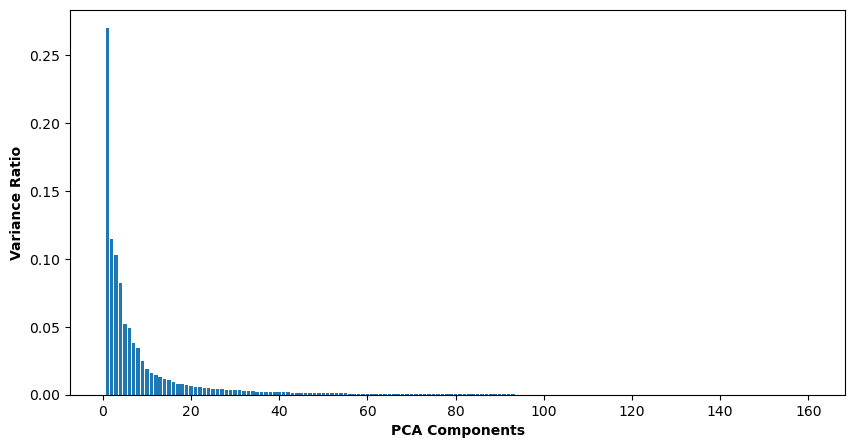

In [25]:
# Variance Ratio bar plot for each PCA components.
plt.figure(figsize = (10, 5))
ax = plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel("PCA Components",fontweight = 'bold')
plt.ylabel("Variance Ratio",fontweight = 'bold')

plt.show()

In [26]:
# calculate the cumulative sum of explained variance ratios
cumulative_sum = np.cumsum(pca.explained_variance_ratio_)

org_col = list(grid_dropped.columns)

num_pc = np.argmax(cumulative_sum >= 0.95) + 1

pc_dict = {'Attribute': org_col}

pc_dict.update({f'PC_{i+1}':pca.components_[i] for i in range(num_pc)})

attributes_pca = pd.DataFrame(pc_dict)

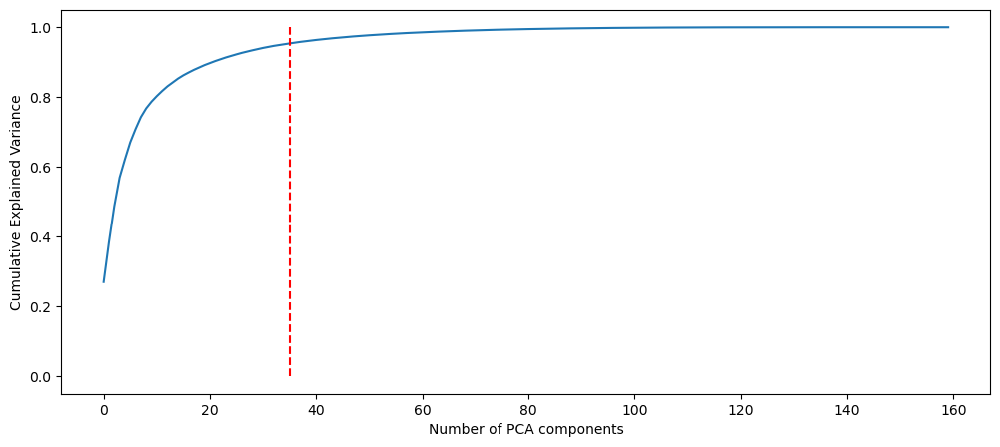

In [27]:
# Scree plot to visualize the Cumulative variance against the Number of components

fig = plt.figure(figsize = (12,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.vlines(x=num_pc, ymax=1, ymin=0, colors="r", linestyles="--")
plt.xlabel('Number of PCA components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [28]:
attributes_pca

,Attribute,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,...,PC_26,PC_27,PC_28,PC_29,PC_30,PC_31,PC_32,PC_33,PC_34,PC_35
0,tess_area_median,-0.047760,-0.112723,-0.043404,0.078411,-0.156778,0.032273,-0.065378,-0.025760,-0.024351,...,-0.078833,-0.036339,-0.007570,0.164001,0.015312,-0.025203,0.075927,-0.066368,0.203269,0.054733
1,tess_area_q25,-0.047574,-0.103750,-0.052471,0.060434,-0.159647,0.073334,-0.078813,0.002799,-0.062409,...,-0.064565,0.120537,0.067586,0.098690,-0.053751,0.017151,0.206634,0.104458,0.122602,-0.036085
2,tess_area_q75,-0.046723,-0.142972,-0.070765,0.075919,-0.104131,0.016599,-0.030316,-0.005416,-0.040292,...,0.007043,-0.100596,0.074438,0.027067,0.027147,0.069278,-0.123475,0.047942,0.121147,0.079402
3,tessellation_neighbours_median,-0.039400,-0.016699,-0.027084,-0.151080,0.214857,-0.043488,0.053688,0.016598,0.065970,...,0.043102,0.172630,-0.059489,-0.009724,0.017462,-0.122981,0.063619,-0.041887,-0.023533,0.034264
4,tessellation_neighbours_q25,-0.053107,-0.002318,0.000484,-0.166020,0.180303,-0.020725,0.043631,-0.002262,0.052790,...,0.038339,0.189897,-0.045719,-0.052109,0.021222,-0.140047,0.137130,-0.082365,0.058180,0.014639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,strokes_count,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000
156,strokes_stroke_length_median,-0.076930,0.079702,-0.048014,-0.018222,0.018587,0.170178,-0.058144,0.085810,0.192594,...,-0.092152,-0.079987,-0.026312,0.040863,0.091040,0.012574,0.009490,0.086403,0.060254,-0.050968
157,strokes_stroke_length_quantile_0.25,-0.058442,0.062051,-0.018007,-0.025515,0.007289,0.178145,-0.030898,0.097290,0.183240,...,-0.104276,-0.122375,-0.141733,0.014409,-0.036478,-0.043457,-0.008063,-0.018483,-0.092939,0.110096
158,strokes_stroke_length_quantile_0.5,-0.076930,0.079702,-0.048014,-0.018222,0.018587,0.170178,-0.058144,0.085810,0.192594,...,-0.092152,-0.079987,-0.026312,0.040863,0.091040,0.012574,0.009490,0.086403,0.060254,-0.050968


In [29]:
# Building the dataframe using Incremental PCA for better efficiency.

inc_pca = IncrementalPCA(n_components=num_pc)

In [30]:
# Fitting the scaled df on incremental pca

df_inc_pca = inc_pca.fit_transform(tessellation_scaled)
df_inc_pca

array([[-1.30309473e+01, -8.18236471e-01,  1.02967634e+00, ...,
         3.03326595e-01, -6.19444688e-01, -1.22389358e+00],
       [ 3.04473068e+00, -3.79512247e+00,  1.07323472e+01, ...,
        -2.64695443e-01,  1.04201585e+00,  1.85876242e+00],
       [ 6.70062765e+00,  7.40770819e-01,  2.47459392e+01, ...,
        -2.01470684e-03, -1.52110400e-02, -1.05283437e+00],
       ...,
       [-6.09955152e+00,  2.63048420e+00,  1.86870293e+00, ...,
        -2.53715318e-01,  6.06416802e-01, -6.09670078e-01],
       [-2.87066539e+00,  3.46715969e+00,  1.64695809e-01, ...,
         7.41414381e-02,  2.58478689e-01,  5.41377682e-01],
       [-6.16762888e+00,  1.79087479e+00,  1.69349127e+00, ...,
         9.07272212e-01, -8.60817005e-01,  2.16540275e-01]])

In [31]:
components_df = pd.DataFrame(inc_pca.components_, columns=features)  # Adjust index based on n_components

In [49]:
# Writing the provided code with modifications to output to a text file

# Creating a string to capture the text that will be printed, for writing to a file
output_text = ""

# Assuming components_df is already defined as shown previously
number_of_features_to_describe = 15  # Change this to choose how many top features to describe for each component

# Iterating through each principal component
for component in components_df.index:
    component_description = f"Describing {component}:\n"
    output_text += component_description
    
    # Sorting the features by their contribution to the component
    sorted_features = components_df.loc[component].abs().sort_values(ascending=False)
    
    # Picking the top features
    top_features = sorted_features.head(number_of_features_to_describe).index
    contributions = sorted_features.head(number_of_features_to_describe).values
    
    # Printing out the top features and their contributions
    for feature, contribution in zip(top_features, contributions):
        feature_description = f" - {feature} with a loading of {contribution:.2f}\n"
        output_text += feature_description
    
    output_text += "\n"  # Add a new line for better readability

print(output_text)
# Writing the output to a text file
with open(f"../output/{place}/PC_summary.txt", "w") as file:
    file.write(output_text)


Describing 0:
 - nodes_global_straightness_centrality_quantile_0.25 with a loading of 0.13
 - nodes_straightness_400m_quantile_0.25 with a loading of 0.13
 - nodes_global_closeness_centrality_primal_quantile_0.25 with a loading of 0.13
 - edges_global_straightness_centrality_quantile_0.25 with a loading of 0.13
 - nodes_meshedness_eucl_500_median with a loading of 0.13
 - nodes_meshedness_eucl_500_quantile_0.5 with a loading of 0.13
 - nodes_meshedness_topo_5_median with a loading of 0.13
 - nodes_meshedness_topo_5_quantile_0.5 with a loading of 0.13
 - edges_global_closeness_centrality_primal	_quantile_0.25 with a loading of 0.13
 - building_neighbour_dist_weight_q75 with a loading of 0.13
 - building_neighbour_dist_weight_median with a loading of 0.13
 - nodes_meshedness_topo_5_quantile_0.25 with a loading of 0.13
 - building_neighbour_dist_weight_q25 with a loading of 0.13
 - nodes_straightness_400m_quantile_0.5 with a loading of 0.13
 - nodes_straightness_400m_median with a loading

In [33]:
import pickle

with open(f"../output/{place}/pca.pickle", 'wb') as f:
    pickle.dump(components_df, f)

In [34]:
# Creating new dataframe with Principal components


df_pca = pd.DataFrame(df_inc_pca, columns=[f"PC_{i+1}" for i in range(num_pc)])

In [35]:
if len(grid_dropped) == len(df_pca):
    df_pca.index = grid_dropped.index
else:
    print("Error: The number of rows in grid_dropped and df_pca do not match.")

In [36]:
geo_col

geometry
row col                                                   
5   20   POLYGON ((259858.895 666247.963, 259948.537 66...
12  19   POLYGON ((259774.390 665468.093, 259864.038 66...
14  20   POLYGON ((259865.508 665241.547, 259955.158 66...
    19   POLYGON ((259775.858 665244.452, 259865.508 66...
    14   POLYGON ((259327.610 665259.004, 259417.260 66...
...                                                    ...
2   15   POLYGON ((259408.494 666598.003, 259498.133 66...
    16   POLYGON ((259498.133 666595.089, 259587.773 66...
    10   POLYGON ((258960.297 666612.599, 259049.936 66...
3   9    POLYGON ((258871.383 666503.692, 258961.023 66...
2   9    POLYGON ((258870.658 666615.524, 258960.297 66...

[272 rows x 1 columns]

In [37]:
df_pca_geometry = geo_col.join(df_pca, how="left")

In [38]:
columns_to_plot = df_pca_geometry.dropna().columns.drop('geometry')

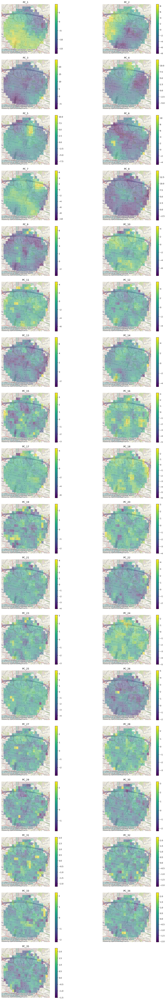

In [39]:
# Number of rows and columns for the subplot grid
n_cols = 2  # You can adjust this based on your preference
n_rows = (len(columns_to_plot) + 1) // n_cols

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 4))

# Flatten axes array for easy iteration, if there's more than one row
axes = axes.flatten() if n_rows > 1 else [axes]

# Loop through the columns and create a plot for each
for i, column in enumerate(columns_to_plot):
    # Plot with translucent colors
    df_pca_geometry.dropna().plot(column=column, ax=axes[i], legend=True, alpha=0.5)  # Adjust alpha for translucency

    # Add Contextily basemap
    ctx.add_basemap(axes[i], crs=df_pca_geometry.crs.to_string())

    axes[i].set_title(column)
    axes[i].set_axis_off()

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [40]:
import pickle

with open(f"../output/{place}/df_pca_geometry.pickle", 'wb') as f:
    pickle.dump(df_pca_geometry, f)

In [41]:
df_pca_with_uID = df_pca.copy()

In [42]:
df_pca_with_uID["uID"] = [str(i) for i in grid_dropped.index]

In [43]:
# Calculating Hopkins score to know whether the data is good for clustering or not.

def hopkins(X):
    d = X.shape[1]
    n = len(X)
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    HS = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(HS):
        print(ujd, wjd)
        HS = 0
 
    return HS


In [44]:
# Hopkins score
Hopkins_score=round(hopkins(df_pca),2)

In [45]:
print(Hopkins_score)

0.82


The Hopkins statistic (introduced by Brian Hopkins and John Gordon Skellam) is a way of measuring the cluster tendency of a data set.[1] It belongs to the family of sparse sampling tests. It acts as a statistical hypothesis test where the null hypothesis is that the data is generated by a Poisson point process and are thus uniformly randomly distributed.[2] A value close to 1 tends to indicate the data is highly clustered, random data will tend to result in values around 0.5, and uniformly distributed data will tend to result in values close to 0.[3]

In [46]:
len(df_pca_with_uID)

271

In [47]:
df_pca.to_parquet(f"../output/{place}/df_pca.pq")